In [44]:
import pywt
import numpy as np
import datetime
from segmentation_3D import *
from skimage.external import tifffile
import matplotlib.pyplot as plt
import os
md_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_Third_2019Mar22/'
out_path = os.path.join(md_path,'results/Attempt1')
if not os.path.exists(out_path):
    os.makedirs(out_path)
    print('making dir')
def Display(img,title='Figure',cmap='inferno',figsize=(10,10),rel_min = 0.1,rel_max =99.9):
    out = img.copy()
    if rel_min>0:
        img_min = np.percentile(img.ravel(),1)
        out[out<img_min]=img_min
    if rel_max<100:
        img_max = np.percentile(img.ravel(),99)
        out[out>img_max]=img_max
    plt.figure(figsize=figsize)
    plt.title(str(title))
    plt.imshow(out,cmap=cmap)
    plt.show()

In [4]:
from metadata import Metadata
md = Metadata(md_path)

In [87]:
#Recover
%matplotlib inline
from skimage import io
pos = 'Pos8'
pos_path = os.path.join(out_path,pos)

nucstk = np.swapaxes(np.swapaxes(io.imread(os.path.join(pos_path,'Raw.tiff')),2,1),2,0)
wave_edge = np.swapaxes(np.swapaxes(io.imread(os.path.join(pos_path,'wave_edge.tiff')),2,1),2,0)
wave_cell = np.swapaxes(np.swapaxes(io.imread(os.path.join(pos_path,'wave_cell.tiff')),2,1),2,0)
wave_sum = np.swapaxes(np.swapaxes(io.imread(os.path.join(pos_path,'wave_sum.tiff')),2,1),2,0)
blurred = np.swapaxes(np.swapaxes(io.imread(os.path.join(pos_path,'Blur.tiff')),2,1),2,0)
cell_center = np.swapaxes(np.swapaxes(io.imread(os.path.join(pos_path,'cell_centers.tiff')),2,1),2,0)
markers = np.swapaxes(np.swapaxes(io.imread(os.path.join(pos_path,'markers.tiff')),2,1),2,0)
im_edge = np.swapaxes(np.swapaxes(io.imread(os.path.join(pos_path,'im_edge.tiff')),2,1),2,0)



In [31]:
pos = 'Pos8'
pos_path = os.path.join(out_path,pos)
if not os.path.exists(pos_path):
    os.makedirs(pos_path)
    print('making dir')
params = {
    'image_blur' : 4.0, #gaussian kernal
    'threshold' : 65, #0-100
    'smallest_object' : 900, #pixels
    'dist_intensity_ratio' : 0.75, #0-1 weight
    'separation_distance' : 50, #pixels
    'edge_filter_blur' : 1.0, #kernel width in pixels
    'watershed_ratio' : 0.9, #0-1 ratio of distance from edge vs bwgeodesic
    'remove_image_edges': 0, # If true set all edges to 0
    'wavelet': 'db9', # wavelet to use
    'keep_list': [4,5,6], # wavelets to keep
                 }
with open(os.path.join(pos_path,'params.txt'), "w") as text_file:
    text_file.write(str(params))

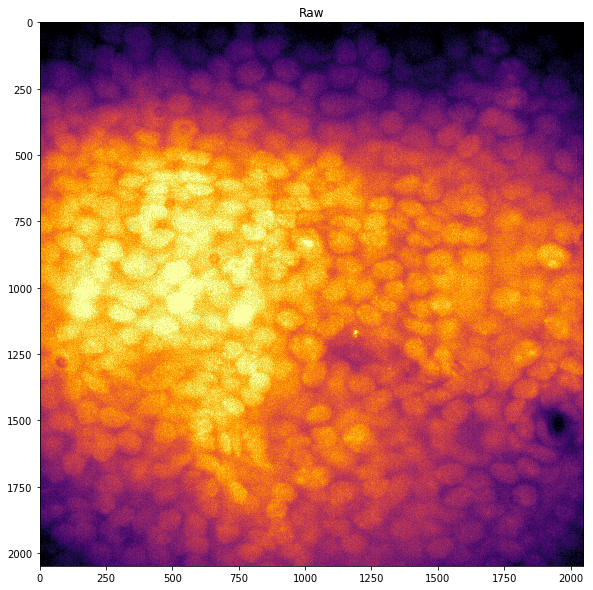

In [34]:
%matplotlib inline
nucstk = md.stkread(Position=pos,Channel='DeepBlue',acq='nuc_highWellCapacity_6')
fname = os.path.join(pos_path,'Raw.tiff')
tifffile.imsave(fname, np.swapaxes(np.swapaxes(nucstk,0,2),1,2), metadata={'axes': 'ZYX'})
Display(nucstk[:,:,40],title='Raw')

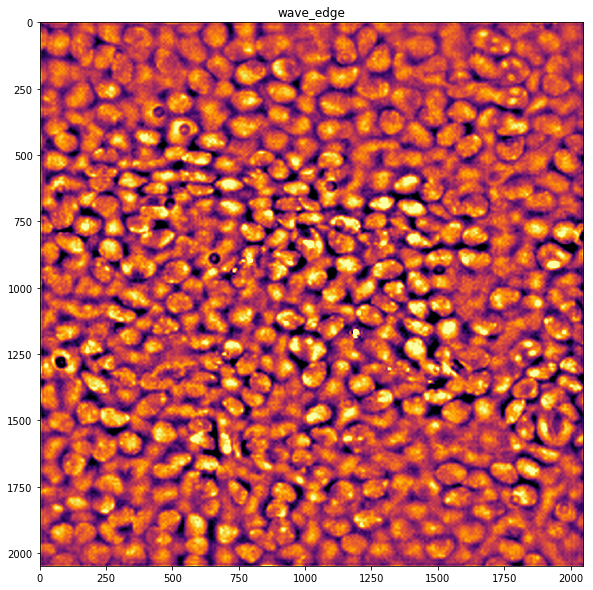

In [35]:
%matplotlib inline
wave_edge = wavelettransform(nucstk,'db9',keep_list=[4,5,6])
fname = os.path.join(pos_path,'wave_edge.tiff')
tifffile.imsave(fname, np.swapaxes(wave_edge,0,2), metadata={'axes': 'ZYX'})
Display(wave_edge[:,:,40],title='wave_edge')

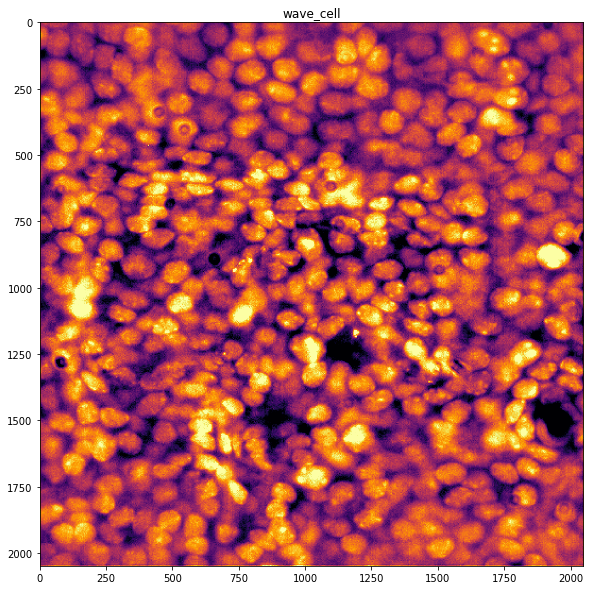

In [36]:
%matplotlib inline
wave_cell = wavelettransform(nucstk,'db3',keep_list=[3,4,5,6,7,8])
fname = os.path.join(pos_path,'wave_cell.tiff')
tifffile.imsave(fname, np.swapaxes(wave_cell,0,2), metadata={'axes': 'ZYX'})
Display(wave_cell[:,:,40],title='wave_cell')

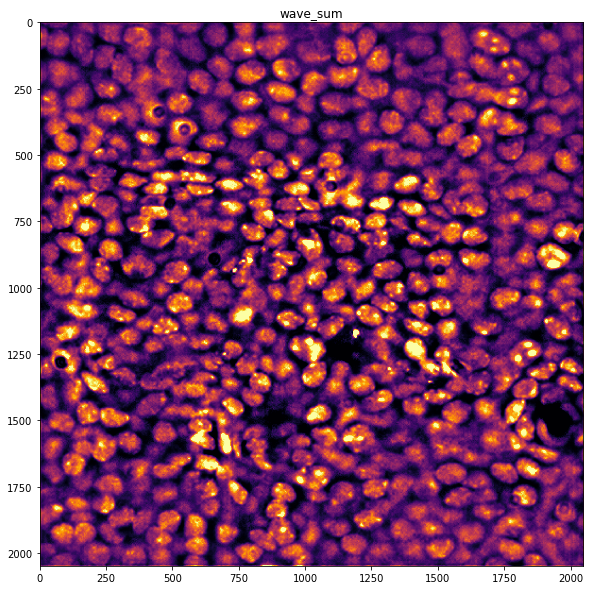

In [33]:
%matplotlib inline
wave_sum = wave_edge * wave_cell
fname = os.path.join(pos_path,'wave_sum.tiff')
tifffile.imsave(fname, np.swapaxes(wave_sum,0,2), metadata={'axes': 'ZYX'})
Display(wave_sum[:,:,40],title='wave_sum')

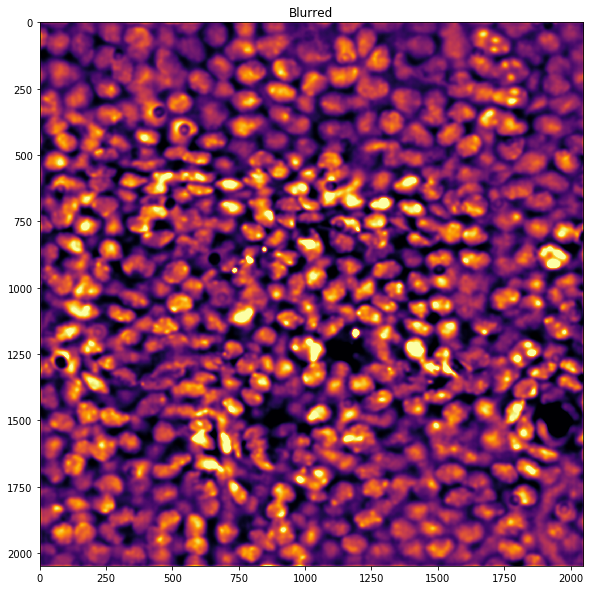

In [37]:
%matplotlib inline
blurred = blur(wave_sum, params['image_blur'])
fname = os.path.join(pos_path,'Blur.tiff')
tifffile.imsave(fname, np.swapaxes(blurred,0,2), metadata={'axes': 'ZYX'})
Display(blurred[:,:,40],title='Blurred')

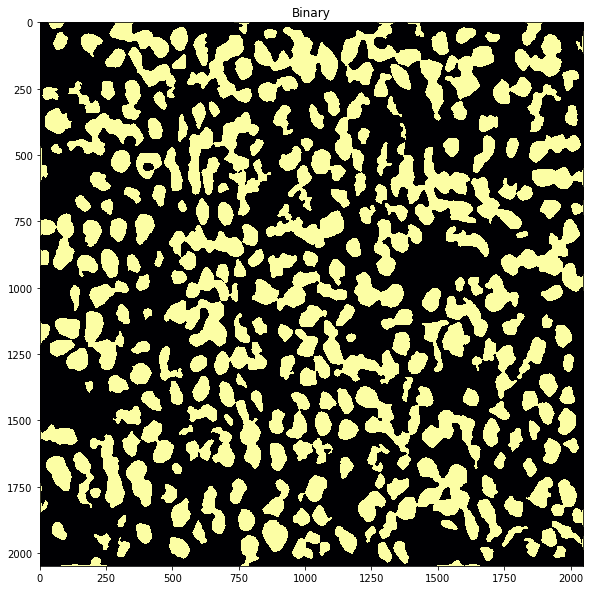

In [48]:
%matplotlib inline
im_bin = binarize(blurred,params['threshold'],params['smallest_object'])
Display(im_bin[:,:,40],title='Binary')

In [ ]:
def binarize(blurred,thresh,min_size):
    background = blur(blurred,100)
    stk = blurred/background
    thresh = np.percentile(stk,thresh)
    im_bin = stk > thresh
    for z in range(im_bin.shape[2]):
        im_bin[:,:,z] = morphology.remove_small_objects(im_bin[:,:,z], min_size)
        im_bin[:,:,z] = morphology.remove_small_holes(im_bin[:,:,z], min_size)
        
    return im_bin
%matplotlib inline
im_bin = binarize(blurred,params['threshold'],params['smallest_object'])
Display(im_bin[:,:,40],title='Binary')

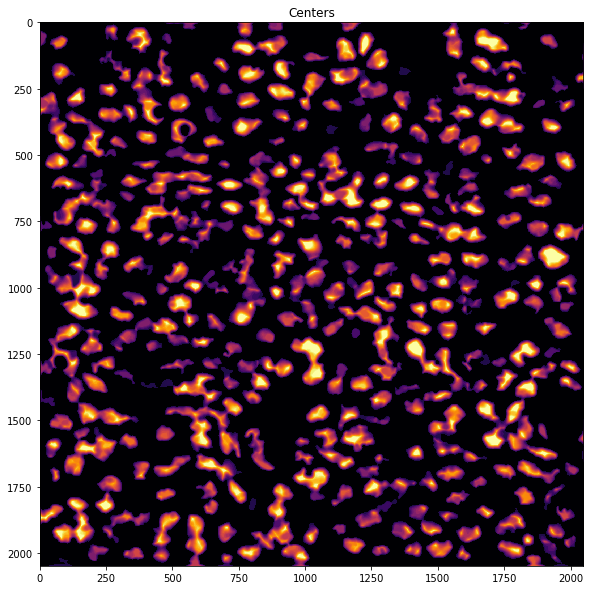

In [39]:
%matplotlib inline
[cell_center, d_mat] = cell_centers(blurred, im_bin, params['dist_intensity_ratio'])
fname = os.path.join(pos_path,'cell_centers.tiff')
tifffile.imsave(fname, np.swapaxes(cell_center,0,2), metadata={'axes': 'ZYX'})
Display(cell_center[:,:,40],title='Centers')

In [77]:
def colorize_segmented_image(img, color_type='rgb'):
    """
    Returns a randomly colorized segmented image for display purposes.
    :param img: Should be a numpy array of dtype np.int and 2D shape segmented
    :param color_type: 'rg' for red green gradient, 'rb' = red blue, 'bg' = blue green
    :return: Randomly colorized, segmented image (shape=(n,m,3))
    """
    # get empty rgb_img as a skeleton to add colors
    rgb_img = np.zeros((img.shape[0], img.shape[1], 3))

    # make your colors
    num_cells = np.max(img)  # find the number of cells so you know how many colors to make
    colors = np.random.randint(0, 255, (num_cells, 3))
    if not 'r' in color_type:
        colors[:, 0] = 0  # remove red
    if not 'g' in color_type:
        colors[:, 1] = 0  # remove green
    if not 'b' in color_type:
        colors[:, 2] = 0  # remove blue

    regions = regionprops(img)
    for i in range(1, len(regions)):  # start at 1 because no need to replace background (0s already)
        rgb_img[tuple(regions[i].coords.T)] = colors[i]  # won't use the 1st color

    return rgb_img.astype(np.int)

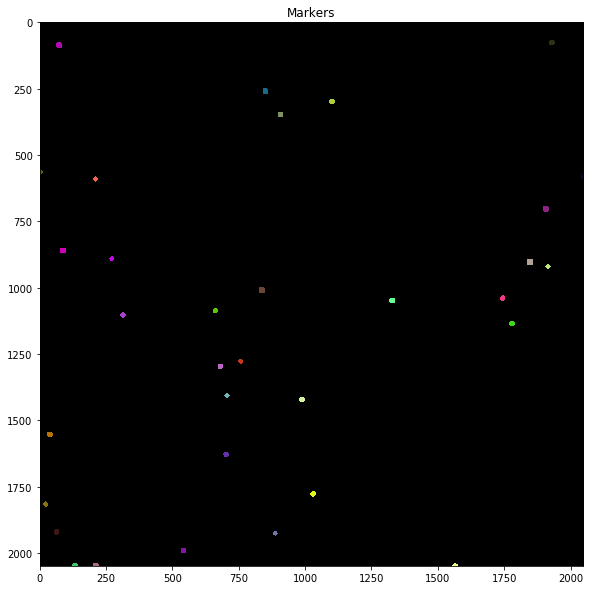

In [78]:
%matplotlib inline
markers = fg_markers(cell_center, im_bin, params['separation_distance'], params['remove_image_edges'])
fname = os.path.join(pos_path,'markers.tiff')
tifffile.imsave(fname, np.swapaxes(markers,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(markers[:,:,40])
Display(out,title='Markers',rel_min=0,rel_max=100)

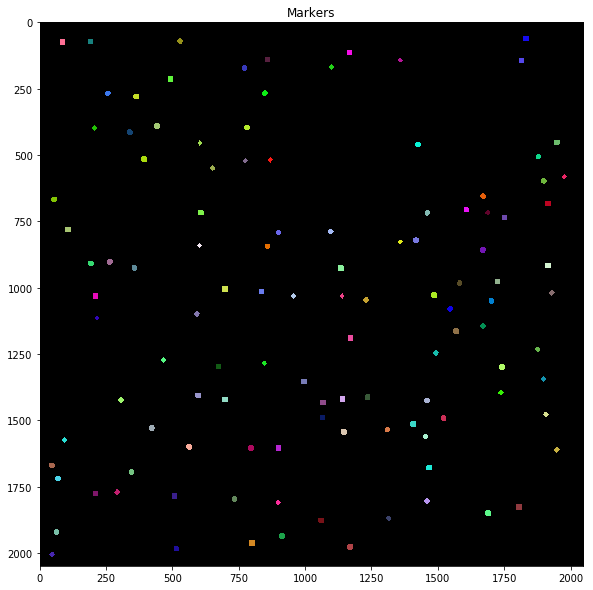

In [90]:
im_cent = cell_center
val = 40
edges = 1
local_maxi = peak_local_max(blurred, indices=False, min_distance=int(val), exclude_border=int(edges))
struct = ndimage.generate_binary_structure(3,2)
local_maxi = ndimage.binary_dilation(local_maxi,structure=struct,iterations=10)
structure = ndimage.morphology.generate_binary_structure(3, 1)
markers = ndimage.label(local_maxi,structure=structure)[0]
markers[local_maxi] += 1
out = colorize_segmented_image(markers[:,:,40])
Display(out,title='Markers',rel_min=0,rel_max=100)

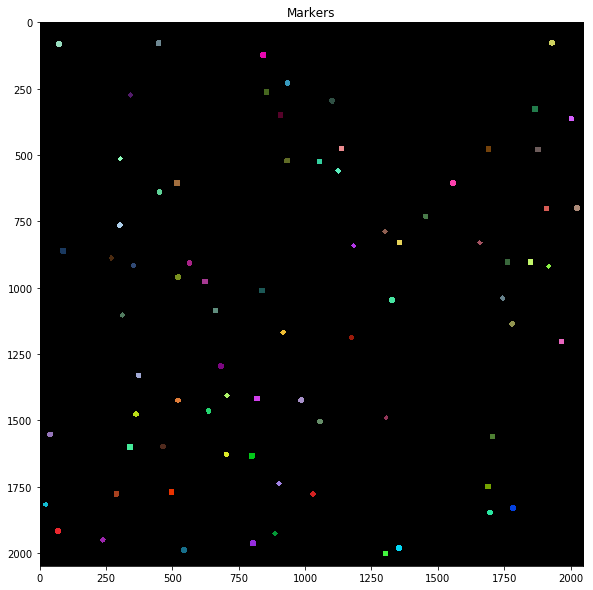

In [82]:
im_cent = cell_center
val = 30
edges = 1
local_maxi = peak_local_max(blur(im_cent,4), indices=False, min_distance=int(val), exclude_border=int(edges))
struct = ndimage.generate_binary_structure(3,2)
local_maxi = ndimage.binary_dilation(local_maxi,structure=struct,iterations=10)
structure = ndimage.morphology.generate_binary_structure(3, 1)
markers = ndimage.label(local_maxi,structure=structure)[0]
markers[local_maxi] += 1
out = colorize_segmented_image(markers[:,:,40])
Display(out,title='Markers',rel_min=0,rel_max=100)

In [152]:
from skimage.filters import threshold_adaptive
stk = blurred.copy()
im_bin = np.zeros_like(stk)
for z in range(stk.shape[2]):
    im_bin[:,:,z] = threshold_local(stk[:,:,z],71)
Display(im_bin[:,:,40],title='Binary')

IndexError: too many indices for array

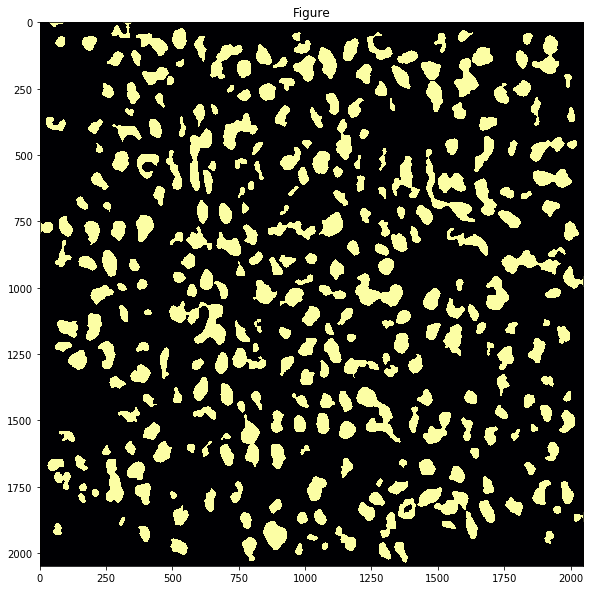

In [180]:
temp = stk[:,:,40]/filters.gaussian(stk[:,:,40],100)
im_bin = temp>np.percentile(temp.ravel(),80)
min_size = 500
im_bin = morphology.remove_small_objects(im_bin, min_size)
im_bin = morphology.remove_small_holes(im_bin, min_size)
Display(im_bin)

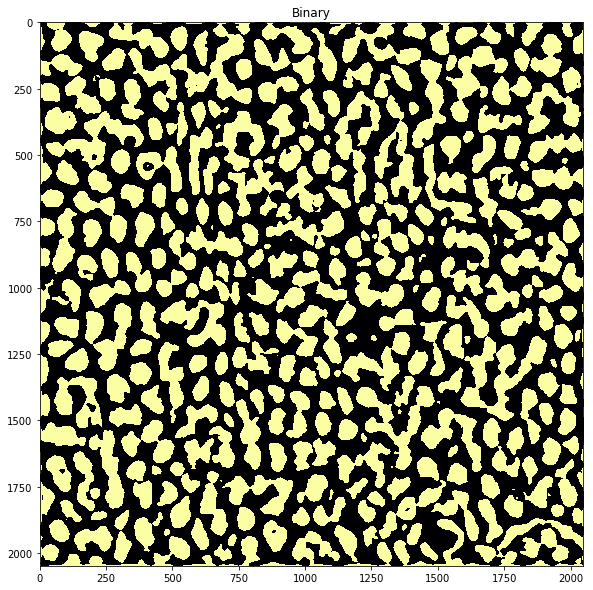

In [169]:
Display(stk[:,:,40]>threshold_local(stk[:,:,40],201),title='Binary')

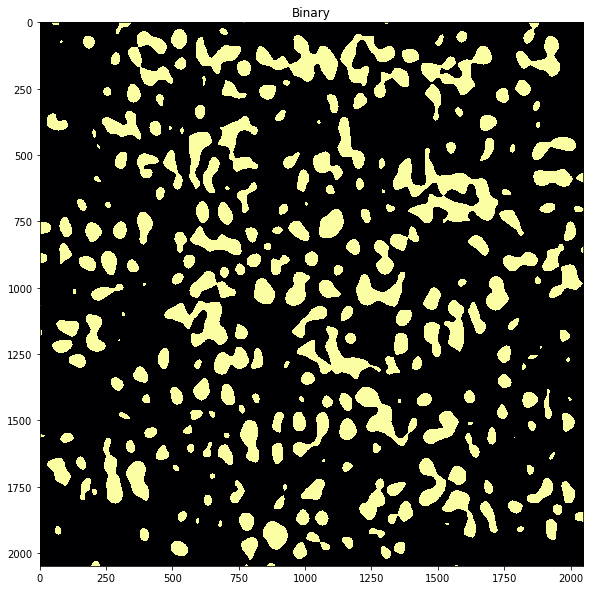

In [151]:
from skimage.filters import threshold_local
img = blurred[:,:,35].copy()
im_bin2 = threshold_local(img,71)
Display(im_bin2>np.percentile(im_bin2.ravel(),80),title='Binary')

In [133]:
from skimage.filters import threshold_adaptive
img = blurred[:,:,40]
im_bin2 = threshold_adaptive(img,101)
Display(im_bin2,title='Binary')

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/skimage/filters/thresholding.py:229: skimage_deprecation: Function ``threshold_adaptive`` is deprecated and will be removed in version 0.15. Use ``threshold_local`` instead.
  def threshold_adaptive(image, block_size, method='gaussian', offset=0,
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/skimage/filters/thresholding.py:231: UserWarning: The return value of `threshold_local` is a threshold image, while `threshold_adaptive` returned the *thresholded* image.
  warn('The return value of `threshold_local` is a threshold image, while '


ValueError: The parameter `image` must be a 2-dimensional array

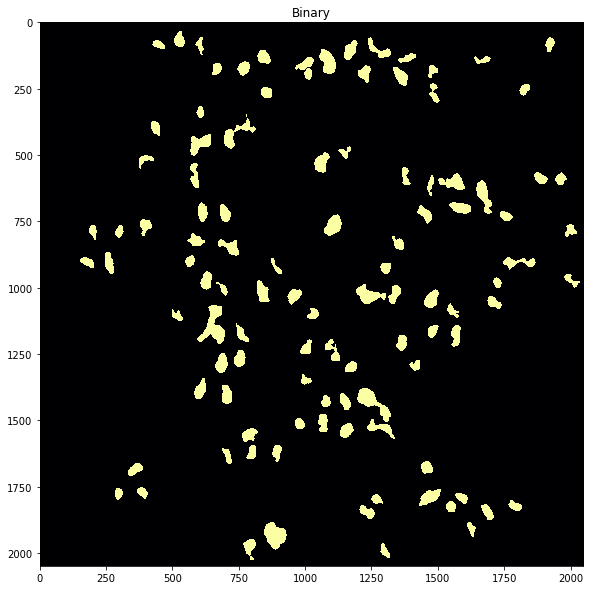

In [111]:
%matplotlib inline
im_bin = binarize(blurred,95,params['smallest_object'])
Display(im_bin[:,:,40],title='Binary')

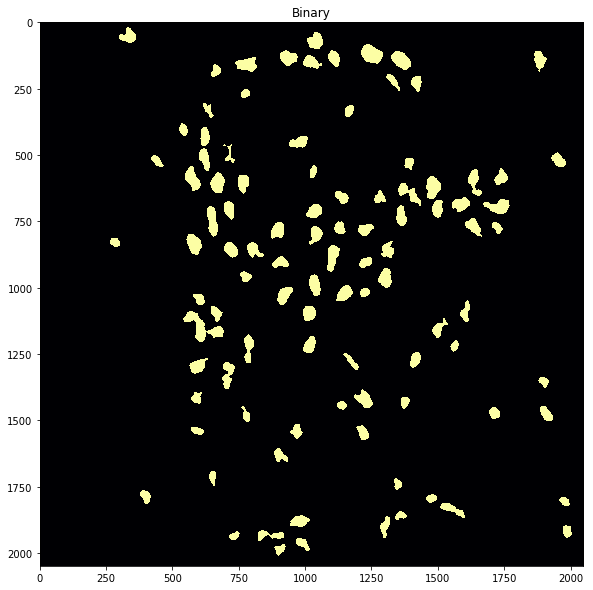

In [117]:
Display(im_bin[:,:,60],title='Binary')

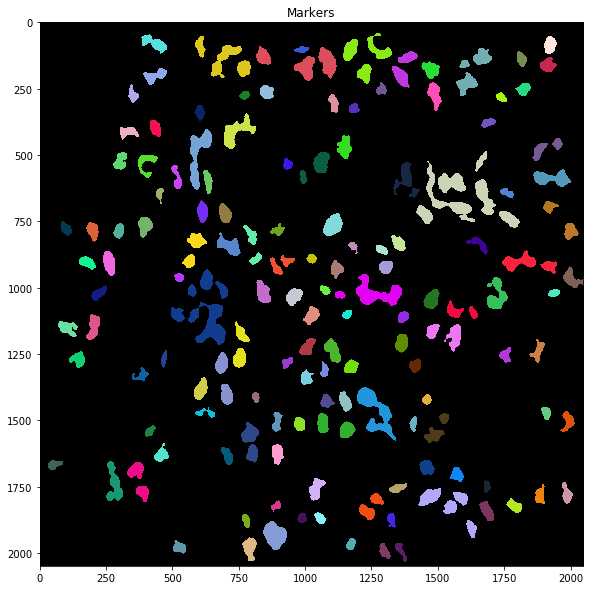

In [108]:
%matplotlib inline
im_bin = binarize(blurred,90,params['smallest_object'])
structure = ndimage.morphology.generate_binary_structure(3, 1)
markers = ndimage.label(im_bin,structure=structure)[0]
out = colorize_segmented_image(markers[:,:,40])
Display(out,title='Markers',rel_min=0,rel_max=100)

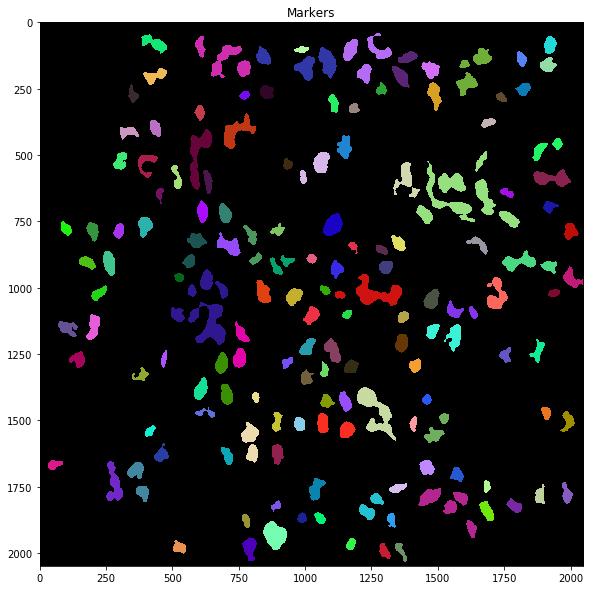

In [110]:
structure = ndimage.morphology.generate_binary_structure(3, 1)
erode = ndimage.morphology.binary_erosion(im_bin,structure=structure)
markers = ndimage.label(im_bin,structure=structure)[0]
out = colorize_segmented_image(markers[:,:,40])
Display(out,title='Markers',rel_min=0,rel_max=100)

In [109]:
tifffile.imsave(fname, np.swapaxes(markers,0,2), metadata={'axes': 'ZYX'})


0.7911547522232867

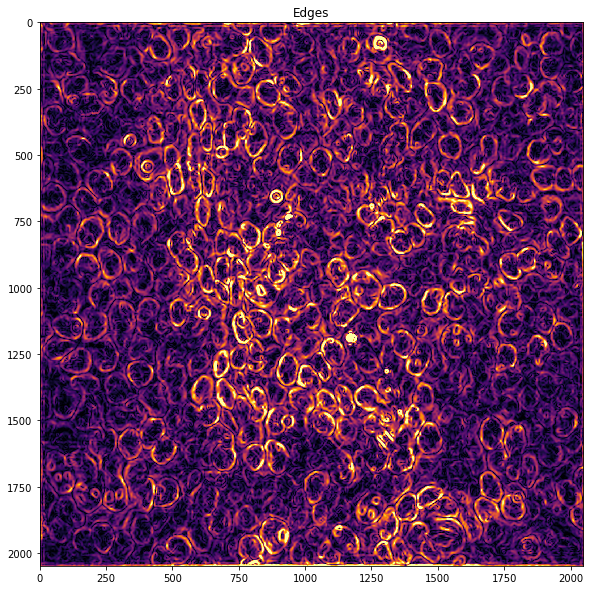

In [33]:
%matplotlib inline
im_edge = sobel_edges(wave_edge, params['edge_filter_blur'])
fname = os.path.join(pos_path,'im_edge.tiff')
tifffile.imsave(fname, np.swapaxes(im_edge,0,2), metadata={'axes': 'ZYX'})
Display(im_edge[:,:,40],title='Edges')

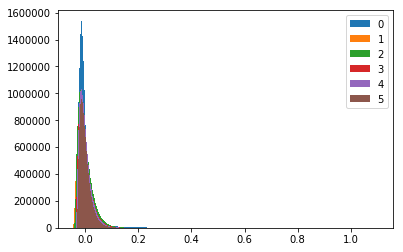

In [23]:
for z in range(int(im_edge.shape[2]/11)):
    plt.hist(np.log2(im_edge[:,:,int(z*11):int(z*11)+11].ravel()),bins=1000,label=z)
plt.legend()
plt.show()


In [21]:
im_edge.shape[2]

66

In [ ]:
%matplotlib inline
im = watershed(markers, im_bin, im_edge, d_mat, params['watershed_ratio'], params['remove_image_edges'])
fname = os.path.join(pos_path,'watershed.tiff')
tifffile.imsave(fname, np.swapaxes(im,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(im[:,:,40], 'bg')
Display(out,title='Watershed')

In [65]:
pos = 'Pos6'
nucstk = md.stkread(Position=pos,Channel='DeepBlue',acq='nuc_highWellCapacity_6')
params = {
        'clip_limit' : 0.17, # 0-1
        'background_blur' : 180, #block size I think?
        'image_blur' : 4.0, #gaussian kernal
        'threshold' : 80, #0-100
        'smallest_object' : 900, #pixels
        'dist_intensity_ratio' : 0.75, #0-1 weight
        'separation_distance' : 40, #pixels
        'edge_filter_blur' : 2.0, #kernel width in pixels
        'watershed_ratio' : 0.75, #0-1 ratio of distance from edge vs bwgeodesic
        'remove_image_edges': 1, # If true set all edges to 0
        'wavelet': 'db9', # wavelet to use
        'keep_list': [4,5,6], # wavelets to keep
                 }

In [78]:
nucstk = np.swapaxes(np.swapaxes(tifffile.imread(os.path.join(out_path,'Raw_Pos6.tiff')).astype(np.float64),0,2),0,1)
wave_edge = np.swapaxes(tifffile.imread(os.path.join(out_path,'wave_edge_Pos6.tiff')).astype(np.float64),0,2)
wave_cell = np.swapaxes(tifffile.imread(os.path.join(out_path,'wave_cell_Pos6.tiff')).astype(np.float64),0,2)
wave_sum = np.swapaxes(tifffile.imread(os.path.join(out_path,'wave_sum_Pos6.tiff')).astype(np.float64),0,2)
blurred = np.swapaxes(tifffile.imread(os.path.join(out_path,'Blur_Pos6.tiff')).astype(np.float64),0,2)
cell_center = np.swapaxes(tifffile.imread(os.path.join(out_path,'cell_centers_Pos6.tiff')).astype(np.float64),0,2)
markers = np.swapaxes(tifffile.imread(os.path.join(out_path,'markers_Pos6.tiff')),0,2)
im_edge = np.swapaxes(tifffile.imread(os.path.join(out_path,'im_edge_Pos6.tiff')).astype(np.float64),0,2)
labels = np.swapaxes(tifffile.imread(os.path.join(out_path,'watershed_Pos6.tiff')),0,2)


In [79]:
z = 65

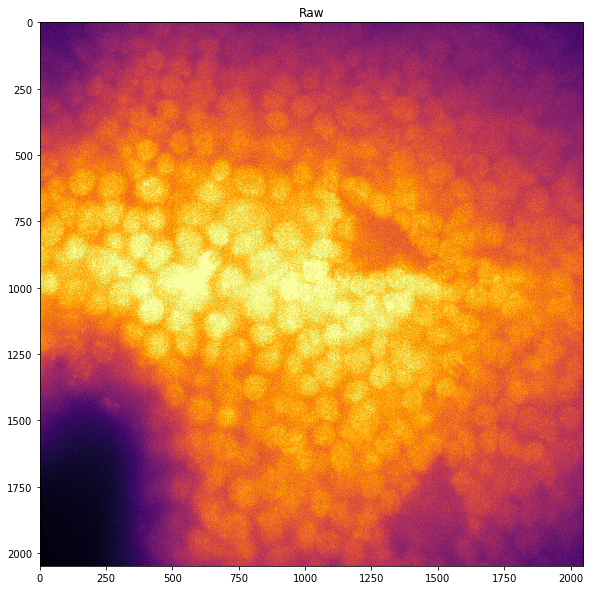

In [80]:
# nucstk = md.stkread(Position=pos,Channel='DeepBlue',acq='nuc_extended_11')
# fname = os.path.join(out_path,'Raw_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(np.swapaxes(nucstk,0,2),1,2), metadata={'axes': 'ZYX'})
Display(nucstk[:,:,z],title='Raw')

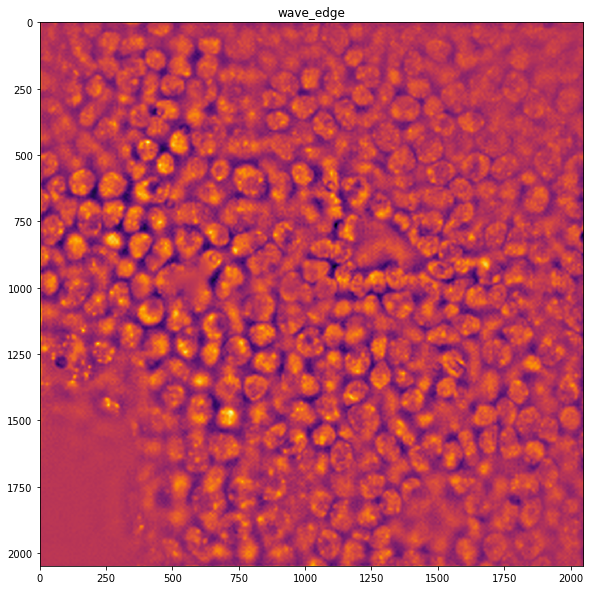

In [81]:
# wave_edge = wavelettransform(nucstk,'db9',keep_list=[4,5,6])
# fname = os.path.join(out_path,'wave_edge_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(wave_edge,0,2), metadata={'axes': 'ZYX'})
Display(wave_edge[:,:,z],title='wave_edge')

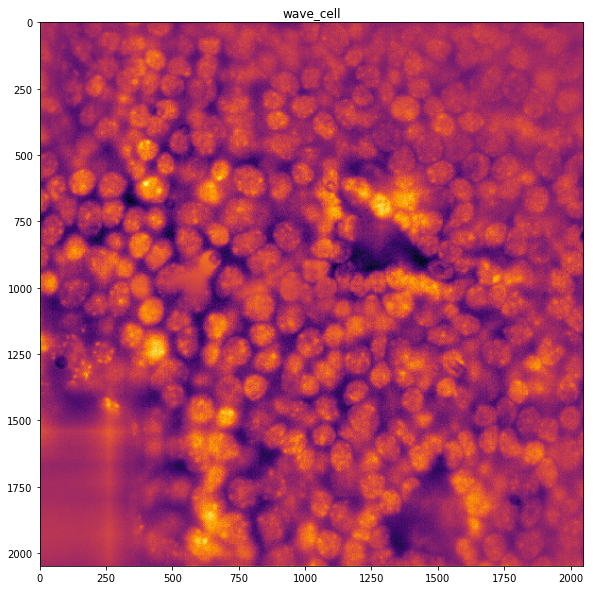

In [82]:
# wave_cell = wavelettransform(nucstk,'db3',keep_list=[3,4,5,6,7,8])
# fname = os.path.join(out_path,'wave_cell_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(wave_cell,0,2), metadata={'axes': 'ZYX'})
Display(wave_cell[:,:,z],title='wave_cell')

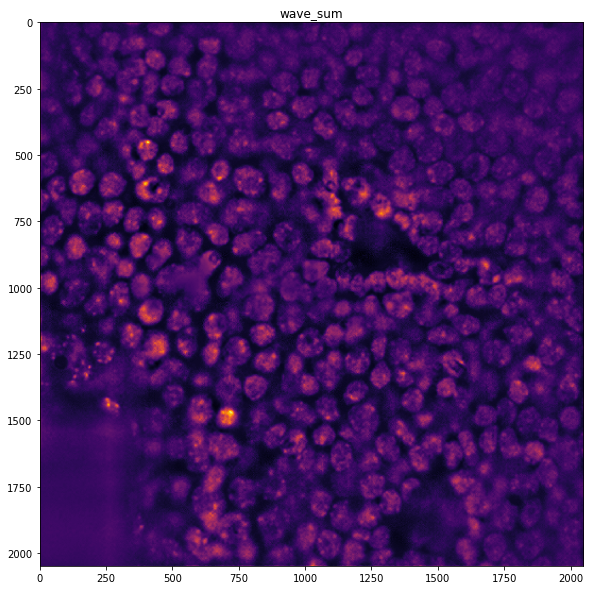

In [83]:
# wave_sum = wave_edge * wave_cell
# fname = os.path.join(out_path,'wave_sum_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(wave_sum,0,2), metadata={'axes': 'ZYX'})
Display(wave_sum[:,:,z],title='wave_sum')

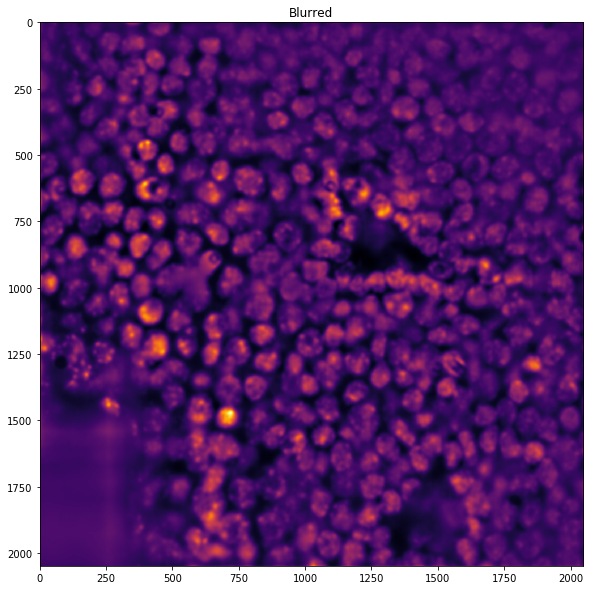

In [84]:
# blurred = blur(wave_sum, params['image_blur'])
# fname = os.path.join(out_path,'Blur_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(blurred,0,2), metadata={'axes': 'ZYX'})
Display(blurred[:,:,z],title='Blurred')

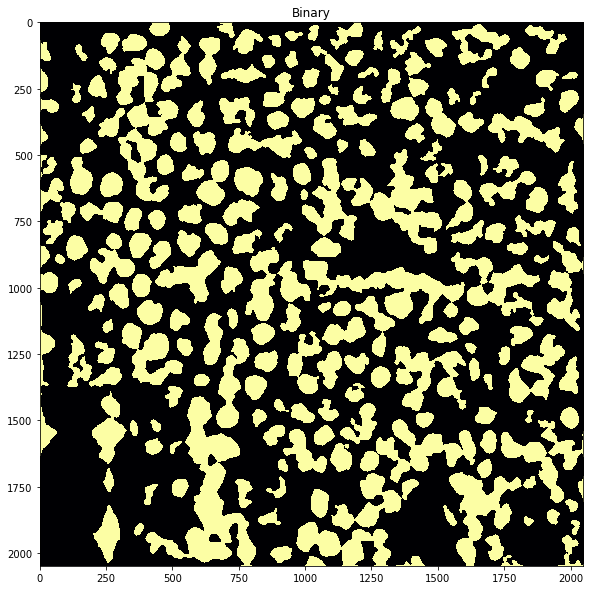

In [85]:
im_bin = binarize(blurred,params['threshold'],params['smallest_object'])
Display(im_bin[:,:,z],title='Binary')

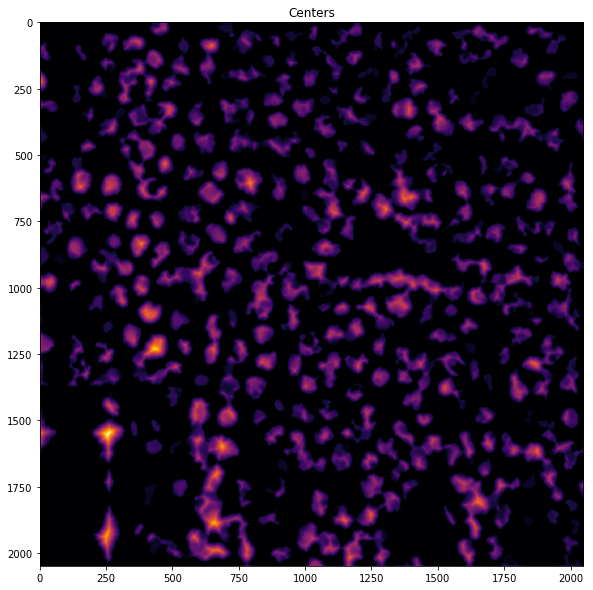

In [86]:
# [cell_center, d_mat] = cell_centers(blurred, im_bin, params['dist_intensity_ratio'])
# fname = os.path.join(out_path,'cell_centers_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(cell_center,0,2), metadata={'axes': 'ZYX'})
Display(cell_center[:,:,z],title='Centers')

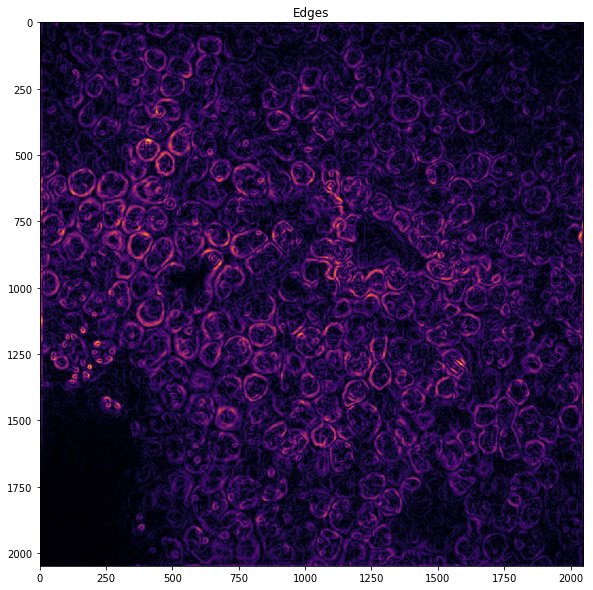

In [87]:
# im_edge = sobel_edges(wave_edge, params['edge_filter_blur'])
# fname = os.path.join(out_path,'im_edge_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(im_edge,0,2), metadata={'axes': 'ZYX'})
Display(im_edge[:,:,z],title='Edges')

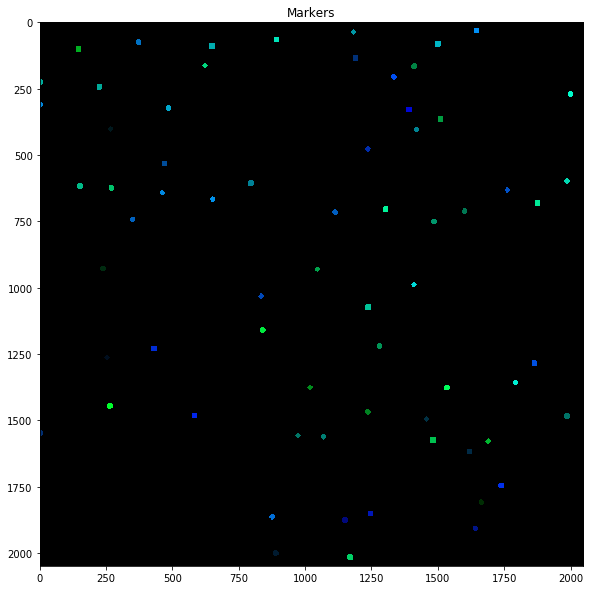

In [88]:
# markers = fg_markers(cell_center, im_bin, params['separation_distance'], params['remove_image_edges'])
# fname = os.path.join(out_path,'markers_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(markers,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(markers[:,:,z], 'bg')
Display(out,title='Markers')

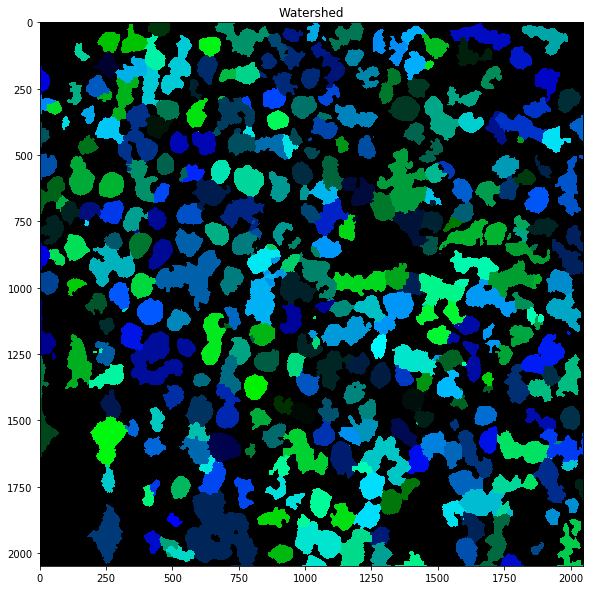

In [89]:
# labels = watershed(markers, im_bin, im_edge, d_mat, params['watershed_ratio'], params['remove_image_edges'])
# fname = os.path.join(out_path,'watershed_Pos6.tiff')
# tifffile.imsave(fname, np.swapaxes(labels,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(labels[:,:,z], 'bg')
Display(out,title='Watershed')

In [94]:
np.log2(1)

0.0

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/matplotlib/axes/_base.py:3449: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


(39799.0, 1000000)

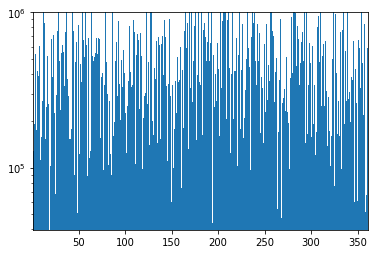

In [98]:
plt.hist(labels.ravel(),bins=np.max(labels),log=True)
plt.xlim([1,np.max(labels)])
plt.ylim([0,10**6])

(array([ 9., 16., 35., 44., 66., 82., 68., 32.,  8.,  1.]),
 array([15.28044456, 15.94864092, 16.61683728, 17.28503365, 17.95323001,
        18.62142637, 19.28962273, 19.95781909, 20.62601546, 21.29421182,
        21.96240818]),
 <a list of 10 Patch objects>)

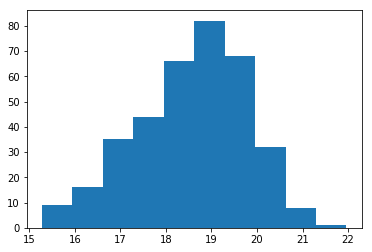

In [107]:
label_pixels = []
for label,pixels in counts.items():
    label_pixels.append(pixels)
plt.hist(np.log2(label_pixels))

In [109]:
2**19*0.1*0.1*0.4

2097.1520000000005

In [52]:
from collections import Counter
counts = Counter(labels.ravel()[labels.ravel()>0])

In [60]:
cells = []
not_cells = []

for label,pixels in counts.items():
    if pixels < 500000:
        not_cells.append(label)
    elif pixels > 2000000:
        not_cells.append(label)
    else:
        cells.append(label)

In [61]:
len(cells)

147

In [62]:
len(not_cells)

214

In [ ]:
out = colorize_segmented_image(labels_filtered[:,:,z], 'bg')
Display(out,title='Watershed')

In [53]:
counts

Counter({1: 127456,
         38: 373229,
         12: 1060133,
         2: 192080,
         4: 176016,
         8: 625789,
         7: 602930,
         17: 256595,
         6: 387196,
         13: 853537,
         27: 760534,
         3: 542058,
         9: 111923,
         5: 420403,
         16: 524270,
         23: 717414,
         15: 246780,
         11: 268724,
         10: 157467,
         22: 476134,
         14: 152693,
         31: 546935,
         36: 1734842,
         35: 749989,
         28: 1753835,
         19: 102086,
         44: 762358,
         18: 39799,
         20: 668794,
         33: 555119,
         21: 381156,
         37: 427451,
         32: 618678,
         29: 484992,
         24: 225365,
         26: 294554,
         54: 1190263,
         30: 235419,
         25: 67292,
         34: 334071,
         43: 1261673,
         39: 289272,
         47: 639940,
         41: 153074,
         40: 153081,
         49: 825769,
         45: 89488,
         46: 477731,

In [56]:
1060133*0.1*0.1*0.4

4240.532000000001

opening img_Pos199_000000040_000000000_DeepBlue_000_040.tif

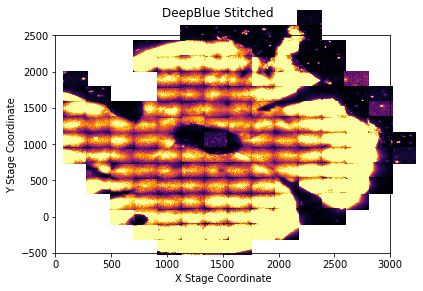

In [111]:
%matplotlib inline
from metadata import Metadata
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
import pywt
from matplotlib.transforms import Bbox, TransformedBbox
import numpy as np
img_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_Second_2019Feb17/'
md = Metadata(img_path)
fig = plt.figure()
ax = fig.add_subplot(111)
artists = []
pos_df = {}
wavelet = 'db9'
for pos in md.image_table.Position.unique():
    if 'Pos' in pos:
        pos_df[pos] = md.image_table[md.image_table.Position==pos].XY.iloc[0]
        x = pos_df[pos][0]
        if x<0:
            continue
        y = pos_df[pos][1]
        im = np.flipud(md.stkread(Position=pos,Channel='DeepBlue',acq='nuc_extended_11',Zindex=40)[:,:,0])
        bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
        bb2 = TransformedBbox(bb,ax.transData)
        bbox_image = BboxImage(bb2,
                            norm = None,
                            origin=None,
                            clip_on=False,
                            cmap='inferno')
        bbox_image.set_data(im)
        ax.add_artist(bbox_image)
ax.set_xlim(0,3000)
ax.set_ylim(-500,2500)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle('DeepBlue Stitched')
plt.show()
fig.savefig('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_Second_2019Feb17/results/DeepBlueStitched')